In [1]:
using Flux, MLDatasets, ImageCore, StatsBase
using MLDatasets: MNIST
using Flux: train!, update!
using Flux: onehot, throttle, crossentropy, relu, sigmoid
using StatsBase: sample

In [2]:
using Plots
using Clustering
using JLD
using LinearAlgebra
using Random
using MultivariateStats

In [1413]:
using Flux
using Flux: Data.DataLoader
using Flux: onehotbatch, onecold, crossentropy
using Flux: @epochs
using Statistics
using MLDatasets

# load full training set
train_x, train_y = FashionMNIST.traindata();

train_x_vec = [vec(train_x[:, :, i]) for i = 1:60000];
train_y_hot = [onehot(train_y[i], 0:9) for i = 1:60000];

# load full test set
test_x,  test_y  = FashionMNIST.testdata();

test_x_vec = [vec(test_x[:, :, i]) for i = 1:10000];
test_y_hot = [onehot(test_y[i], 0:9) for i = 1:10000];

traindata = [(train_x_vec[i], train_y_hot[i]) for i = 1:60000];
testdata = [(test_x_vec[i], test_y_hot[i]) for i = 1:10000];

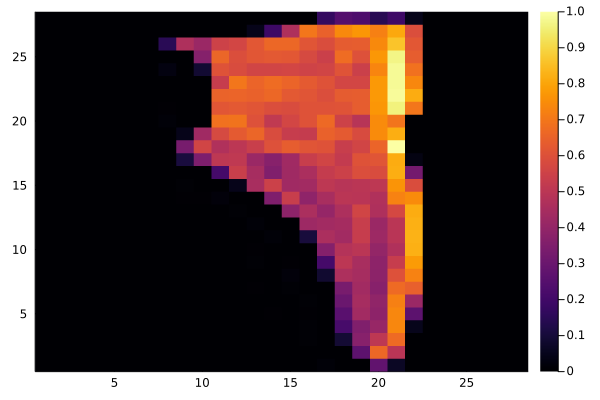

In [1414]:
gr()
heatmap(test_x[:, :, 1])

In [1415]:
struct ParallelReparamLayer
    parallel_layer::Any
    reparams::Matrix{Float64}
    A::Matrix{Float64}
end

function ParallelReparamLayer(
        input,
        func,
        num_folds,
        num_reparams,
        reparam_variance
    )
    # should normalize to lie on hyper sphere?
    reparams = 10*randn(num_reparams, num_folds)
    
    p, re = Flux.destructure(layer)
    num_params = input + 1
    A = reparam_variance*randn((num_params, num_reparams))
    
    parallel_layer = Dense(input, num_folds, func)#Parallel(vcat, [Dense(input, 1, func) for i=1:num_folds])
    
    return ParallelReparamLayer(parallel_layer, reparams, A)
end

# Overload call, so the object can be used as a function
function (m::ParallelReparamLayer)(x)   
    #TODO
    # Define a similar model so that an entire layer of size 784
    # has its own reparameterization matrix (rather than being associated with a node),
    # then stack the layer using vec(m.A*m.reparams) where reparams has as many
    # reparameterizations as number of stacked layers.
    
    # TODO
    # Test this and others with resnet
    
    p, restruct = Flux.destructure(m.parallel_layer);
    
    reparams = vec(m.A*m.reparams)
    
    parallel_reparam_layer = restruct(reparams)

    return parallel_reparam_layer(x)
end

Flux.@functor ParallelReparamLayer

In [1416]:
# I dont understand why this version isn't the correct one
struct ParallelReparamLayer
    parallel_layer::Any
    reparams::Matrix{Float64}
    A::Matrix{Float64}
end

function ParallelReparamLayer(
        input,
        func,
        num_folds,
        num_reparams,
        reparam_variance
    )
    # should normalize to lie on hyper sphere
    reparams = 10*randn(2*num_folds, num_reparams)
    
    p, re = Flux.destructure(layer)
    num_params = input + 1
    A = reparam_variance*randn((num_reparams, num_params))
    
    parallel_layer = Chain(Dense(input, num_folds, func), Dense(input, num_folds, func))#Parallel(vcat, [Dense(input, 1, func) for i=1:num_folds])
    
    return ParallelReparamLayer(parallel_layer, reparams, A)
end

# Overload call, so the object can be used as a function
function (m::ParallelReparamLayer)(x)   
    #TODO
    # Define a similar model so that an entire layer of size 784
    # has its own reparameterization matrix (rather than being associated with a node),
    # then stack the layer using vec(m.A*m.reparams) where reparams has as many
    # reparameterizations as number of stacked layers.
    
    # TODO
    # Test this and others with resnet
    
    p, restruct = Flux.destructure(m.parallel_layer);
    
    reparams1 = vec(m.reparams[1:Int(size(m.reparams)[1]/2), :]*m.A)
    reparams2 = vec(m.reparams[Int(size(m.reparams)[1]/2)+1:end, :]*m.A)
    reparams = [reparams1; reparams2]
    
    #reparams = vec(m.reparams*m.A)
    
    parallel_reparam_layer = restruct(reparams)

    return parallel_reparam_layer(x)
end

Flux.@functor ParallelReparamLayer

In [1420]:
input_size = 784;
output_size = 784;
num_reparams = 6;

In [1425]:
hidden_layer = ParallelReparamLayer(input_size, relu, output_size, num_reparams, .001)
Flux.trainable(hidden_layer::ParallelReparamLayer) = (hidden_layer.A, )

In [1426]:
model = Chain(
    hidden_layer,
    Dense(output_size, 10),
    softmax
)
p, re = Flux.destructure(model)
size(p)[1]
sum(length, params(model))

12560

In [1427]:
# Set which model to use. This can be set to just "model"
# to test how well the model performs when its parameters are trained themselves.
data_model = model;

In [1428]:
ps = Flux.params(data_model)

Params([[-0.00015188216474770237 5.4031366311501245e-5 … 0.00039204172221408615 -7.91277312495332e-5; 8.291299599544043e-5 0.0008910417813278126 … 0.0013211527452720833 -0.0006680803749912915; … ; 0.0003866405485990263 -0.00020702713683836405 … -0.0007859750976437281 -2.18897260266508e-6; -9.722425811778001e-5 -0.0003668573443052455 … -0.0009345216300928873 0.00026316161060904573], Float32[-0.0067536184 -0.025998425 … -0.033750724 -0.041030623; 0.004091446 -0.06141656 … -0.07251422 0.02629511; … ; 0.07414236 0.03922711 … 0.054768432 -0.030693356; -0.033706784 0.043512423 … -0.045701493 0.04751912], Float32[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]])

In [1429]:
# Choose how many samples of the parameters should be taken with num
# This should probably be somewhere between sqrt(num_reparams)
function loss(batch)
    loss = 0
    batchsize = 0
    for data in batch
        batchsize += 1
        loss += Flux.Losses.crossentropy(data_model(data[1]), data[2])
    end
    return loss/batchsize
end
accuracy(x, y) = mean(onecold.(x) .== onecold.(y))

accuracy (generic function with 1 method)

In [1455]:
# TODO
# Batch gradient descent to increase stability
opt = ADAM(.001)

Flux.trainable(hidden_layer::ParallelReparamLayer) = (hidden_layer.A, )
ps = Flux.params(data_model)

num_runs = 1
for j in 1:num_runs
    epochs = 20
    batchsize = 500
    trainsample = sample(traindata, 10000, replace=false);
    train = Flux.DataLoader(trainsample, batchsize=batchsize)
    
    for epoch in 1:epochs

        loss_total = 0
        for (i, d) in enumerate(train)
            # TODO
            # Choose small random sub sample from n sample above and provide to the loss function
            gs = gradient(ps) do
              training_loss = loss(d)
              # Code inserted here will be differentiated, unless you need that gradient information
              # it is better to do the work outside this block.
              return training_loss
            end
            loss_total += loss(d)
            if i%1==0
                println(loss_total/i)
            end
            # Insert whatever code you want here that needs training_loss, e.g. logging.
            # logging_callback(training_loss)
            # Insert what ever code you want here that needs gradient.
            # E.g. logging with TensorBoardLogger.jl as histogram so you can see if it is becoming huge.
            update!(opt, ps, gs)
        end
        println(epoch)
    end
    print("NUMBER OF RUNS: ")
    println(j)
end

1.1065481543965272
6.778146607884728
12.711553126984782
14.870623206427771
15.781200774826218
15.58134838831868
14.554896708070876
13.878863332358575
12.904901047527362
12.26458979992891
11.547282099117213
10.9239125389308
10.359662159923394
9.83006204863264
9.354873020179467
8.91547859691124
8.52168487192645
8.170035127582597
7.844742520874886
7.545807902726471
1
1.3433930051293697
1.4843494049709294
1.5001351340227382
1.5574748311200506
1.543634621676704
1.5120682639102492
1.4811890577749163
1.4713461124302423
1.4540097035114277
1.4274652448883811
1.4078802081669683
1.3971055086164912
1.3770877791611125
1.3528195772775096
1.333877958894827
1.3129173782358416
1.3013414177459348
1.2782431079050178
1.2619970575520867
1.2457097716312637
2
0.8823337834178627
0.8634689262529756
0.8554617584285372
0.8537714230793509


LoadError: InterruptException:

In [1156]:
#save("32_parameter_invariant_model_1_hidden_32_nodes.jld", "A", data_model.A)

In [1456]:
function construct_test_model()
    #layer = Dense(input_size, output_size, relu)
    layer = Chain(Dense(input_size, output_size, relu), Dense(input_size, output_size, relu))
    p, restruct = Flux.destructure(layer);
    
    #layer_reparams = vec(hidden_layer.A*hidden_layer.reparams)
    #layer_reparams = vec(hidden_layer.reparams*hidden_layer.A)
    
    #layer = restruct(layer_reparams)
    
    reparams1 = vec(hidden_layer.reparams[1:Int(size(hidden_layer.reparams)[1]/2), :]*hidden_layer.A)
    reparams2 = vec(hidden_layer.reparams[Int(size(hidden_layer.reparams)[1]/2)+1:end, :]*hidden_layer.A)
    reparams = [reparams1; reparams2]
    
    layer = restruct(reparams)
    
    return Chain(
        layer,
        Dense(output_size, 10, init=(input, output)->ps[2], bias=ps[3]),
        softmax
    )
end

construct_test_model (generic function with 1 method)

In [1457]:
testing_model = construct_test_model()

Chain(
  Chain(
    Dense(784, 784, relu),              # 615_440 parameters
    Dense(784, 784, relu),              # 615_440 parameters
  ),
  Dense(784, 10),                       # 7_850 parameters
  NNlib.softmax,
)                   # Total: 6 arrays, 1_238_730 parameters, 9.421 MiB.

In [1458]:
print("ACCURACY: ")
println(accuracy(testing_model.(test_x_vec), test_y_hot))
testing_ps = Flux.params(model);

ACCURACY: 0.7114


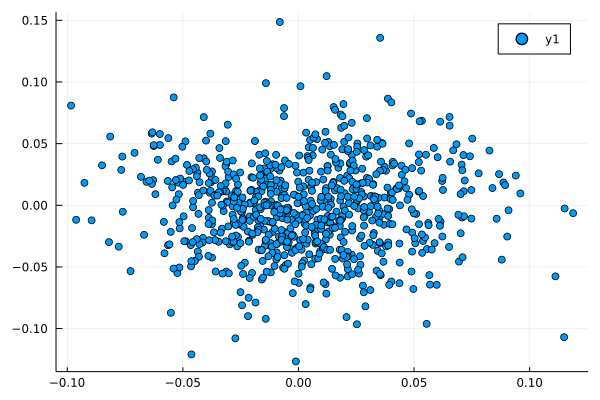

In [1459]:
X = Array{Any}
if(num_reparams > 2)
    M = fit(PCA, transpose(hidden_layer.A))
    X = projection(M);
else
    X = transpose(hidden_layer.A)
end
Plots.plot(X[:, 1], X[:, 2], seriestype = :scatter)

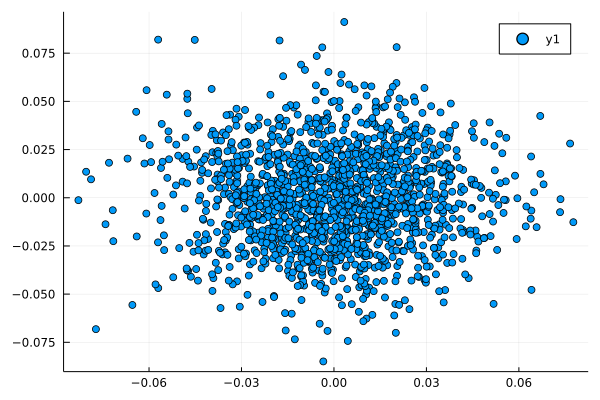

In [1460]:
X = Array{Any}
if(num_reparams > 2)
    M = fit(PCA, hidden_layer.reparams)
    X = projection(M);
else
    X = transpose(hidden_layer.reparams)
end


Plots.plot(X[:, 1], X[:, 2], seriestype = :scatter)

In [1461]:
A_weights = hidden_layer.A[:, 1:784]

digit_accuracy = zeros(10)
for j = 1:10
    digit_ind = (test_y .== (j-1))
    digit_accuracy[j] = accuracy(testing_model.(test_x_vec[digit_ind]), test_y_hot[digit_ind])
end

angle = 0
num_points = 100
filters = zeros(num_points, 28, 28)
for i = 1:num_points
    reparams = [cos(angle), sin(angle), 0, 0, 0, 0]
    
    filters[i, :, :] = reshape(transpose(reparams)*A_weights, (28, 28))

    angle += 2*(3.141592)/num_points;
end

In [1462]:
digit_accuracy

10-element Vector{Float64}:
 0.727
 0.881
 0.499
 0.869
 0.657
 0.709
 0.259
 0.834
 0.831
 0.848

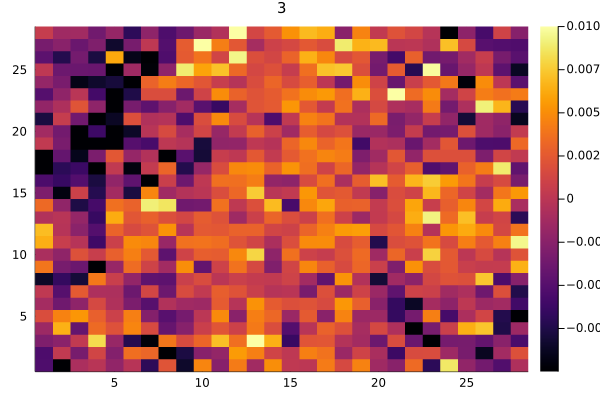

In [1478]:
fold = 3
filter = reshape(A_weights[fold, :], (28, 28))

heatmap(rotr90(rotr90(rotr90(filter))), clim=(-.01, .01), title=fold, titlefontsize=10)

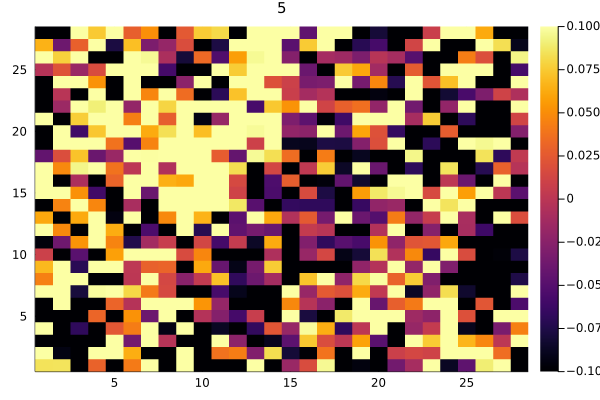

In [1464]:
gr()
filter = reshape(transpose(hidden_layer.reparams[72, :])*A_weights, (28, 28))

heatmap(rotr90(rotr90(rotr90(filter))), clim=(-.1, .1), title=fold, titlefontsize=10)

In [1465]:
vec1 = transpose(hidden_layer.reparams[1, :])*A_weights
vec2 = params(testing_model[1])[1][1, :]

dot(vec1, vec2)/(norm(vec1)*norm(vec2))

0.9999999999999993

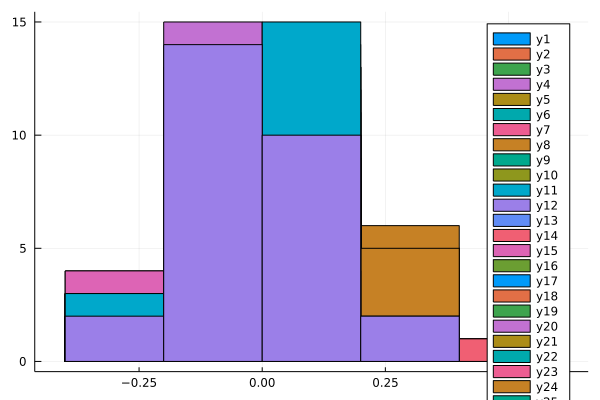

In [1466]:
histogram(filter)

In [1467]:
gr()
mat = filters
anim = @animate for i = 1:num_points
    heatmap(rotr90(rotr90(rotr90(filters[i, :, :]))), clim=(-.01, .01), title=i, titlefontsize=10)
end

Animation("/var/folders/p4/z_tmb2f52hzf4k5l30hd_j_m0000gn/T/jl_UD6rQA", ["000001.png", "000002.png", "000003.png", "000004.png", "000005.png", "000006.png", "000007.png", "000008.png", "000009.png", "000010.png"  …  "000091.png", "000092.png", "000093.png", "000094.png", "000095.png", "000096.png", "000097.png", "000098.png", "000099.png", "000100.png"])

┌ Info: Saved animation to 
│   fn = /Users/joshnunley/src/evolve-parametrization/tutorial_anim_fps30.gif
└ @ Plots /Users/joshnunley/.julia/packages/Plots/kyYZF/src/animation.jl:104


Plots.AnimatedGif("/Users/joshnunley/src/evolve-parametrization/tutorial_anim_fps30.gif")
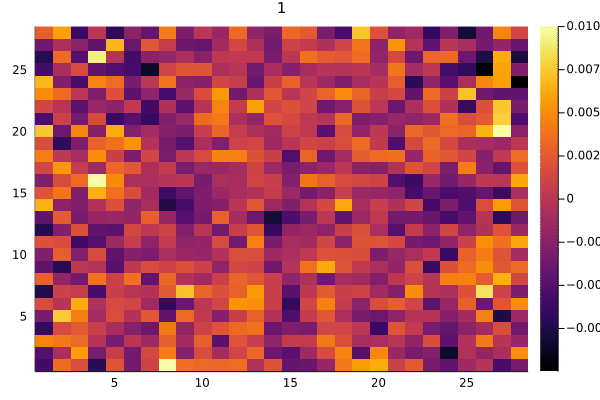

In [1468]:
gif(anim, "tutorial_anim_fps30.gif", fps = 10)

In [1469]:
size(A_weights)

(6, 784)

In [1470]:
# Visualize a 2 parameter reparameterization on the plane.
# Cluster the parameters, even in higher dimensions (maybe IsoMap for dimensionality reduction)
# Could the number of clusters represent the minimal necessary parameters?
vec_set = randn((784, num_reparams))#A_weights
eps = 0.000001
x_size = num_reparams#size(vec_set)[1]
gramian = zeros((x_size, x_size))
@Threads.threads for i = 1:x_size
    println(i)
    for j = 1:x_size
        ith = vec_set[:, i] .+ eps
        jth = vec_set[:, j] .+ eps
        gramian[i, j] = dot(ith, jth)/(norm(ith)*norm(jth))#sqrt(sum((ith-jth).^2))
    end
end

2
4
3
5
6
1


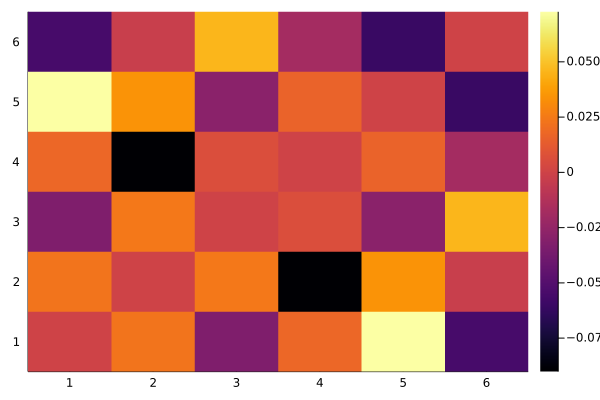

In [1471]:
gr()
heatmap(gramian - I)

In [1472]:
#mat = randn(256, 10)*randn(10, 784)

mat = params(testing_model[1])[3]
gr()
heatmap(mat)

In [1473]:
gr()
anim = @animate for i = 1:200#output_size
    heatmap(rotr90(rotr90(rotr90(reshape(mat[i, :], (28, 28))))), clim=(-.7, .7), title=i, titlefontsize=10)
end

Animation("/var/folders/p4/z_tmb2f52hzf4k5l30hd_j_m0000gn/T/jl_h7hOin", ["000001.png", "000002.png", "000003.png", "000004.png", "000005.png", "000006.png", "000007.png", "000008.png", "000009.png", "000010.png"  …  "000191.png", "000192.png", "000193.png", "000194.png", "000195.png", "000196.png", "000197.png", "000198.png", "000199.png", "000200.png"])

┌ Info: Saved animation to 
│   fn = /Users/joshnunley/src/evolve-parametrization/tutorial_anim_fps30.gif
└ @ Plots /Users/joshnunley/.julia/packages/Plots/kyYZF/src/animation.jl:104


Plots.AnimatedGif("/Users/joshnunley/src/evolve-parametrization/tutorial_anim_fps30.gif")
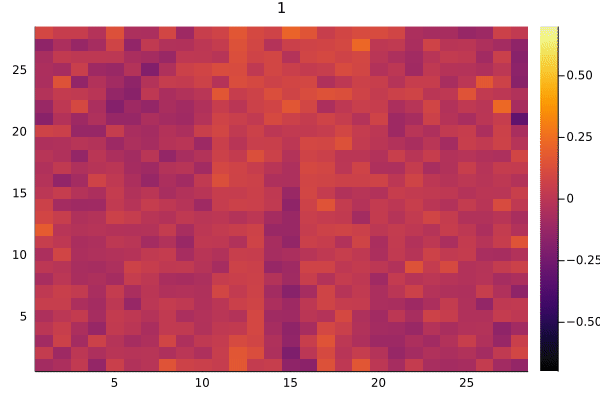

In [1474]:
gif(anim, "tutorial_anim_fps30.gif", fps = 5) 